# Libraries

In [2]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import numpy as np
import torch.nn.functional as F
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

# Data Exploration

In [3]:
refimgs_folder = '/kaggle/input/image-data/refimgs'

refimgs_images = os.listdir(refimgs_folder)

# Function to open an image and convert it to a numpy array
def load_image_as_array(image_path):
    with Image.open(image_path) as img:
        return np.array(img)

# Function to display a pair of images (compressed and original)
def display_image(ref_image, title_ref):
    plt.figure(figsize=(5, 5))  
    plt.imshow(ref_image)
    plt.title(title_ref)
    plt.axis('off') 
    plt.show()

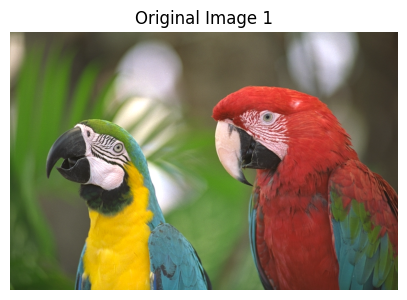

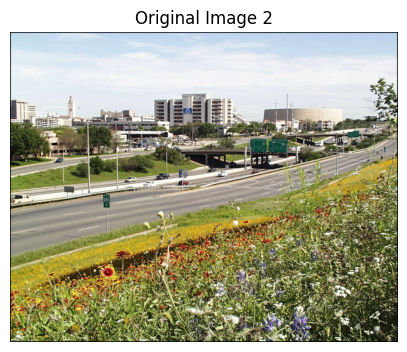

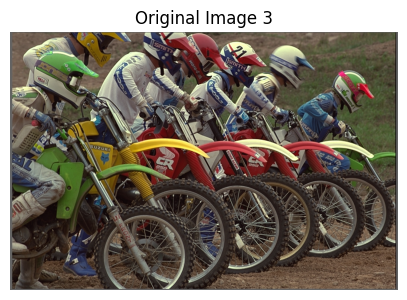

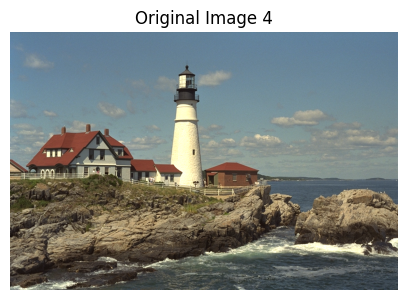

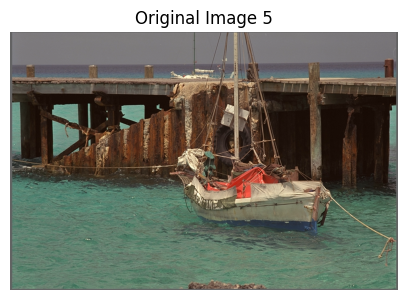

...

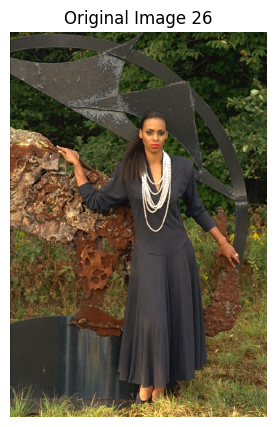

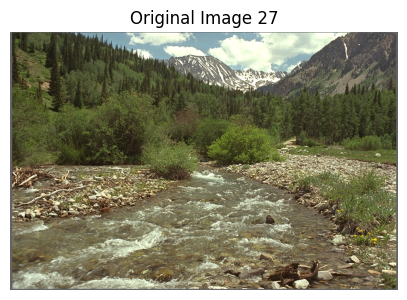

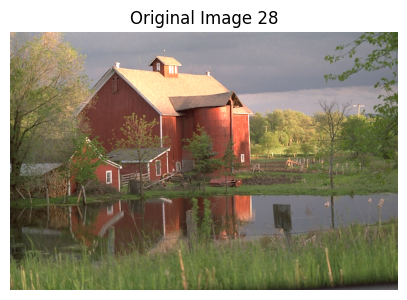

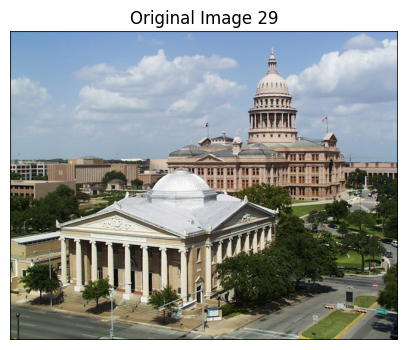

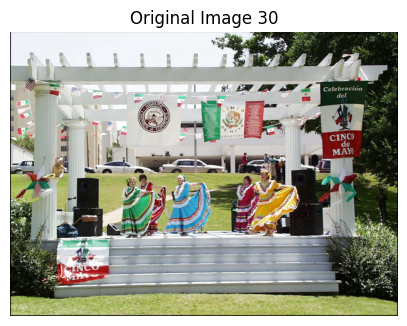

In [4]:
for i, image_file in enumerate(refimgs_images):
    if image_file == 'Thumbs.db':
        continue  

    ref_image_path = os.path.join(refimgs_folder, image_file)

    ref_image = load_image_as_array(ref_image_path)

    display_image(ref_image, f'Original Image {i+1}')

In [5]:
# Function to open an image and convert it to a numpy array
def load_image_as_array(image_path):
    with Image.open(image_path) as img:
        return np.array(img)

# Function to normalize image values to [0, 1] range
def normalize_image(image):
    return image / 255.0

# Function to load and normalize images from a given folder
def load_and_normalize_images(folder_path):
    valid_image_extensions = ['.jpg', '.jpeg', '.png', '.bmp']  
    images = [img for img in os.listdir(folder_path) if os.path.splitext(img)[1].lower() in valid_image_extensions]
    return [normalize_image(load_image_as_array(os.path.join(folder_path, img))) for img in images]

base_folder = '/kaggle/input/image-data'  

quality_folders = ['qf10', 'qf20', 'qf30', 'qf40', 'qf50', 'qf60', 'qf70', 'qf80', 'qf90']

# Dictionary to hold images from all quality folders
quality_images_dict = {}

for folder in quality_folders:
    folder_path = os.path.join(base_folder, folder)
    quality_images_dict[folder] = load_and_normalize_images(folder_path)

ref_images_path = os.path.join(base_folder, 'refimgs')
ref_images_list = load_and_normalize_images(ref_images_path)


print({folder: len(quality_images_dict[folder]) for folder in quality_folders})
print(f"Number of reference images: {len(ref_images_list)}")

{'qf10': 29, 'qf20': 29, 'qf30': 29, 'qf40': 29, 'qf50': 29, 'qf60': 29, 'qf70': 29, 'qf80': 29, 'qf90': 29}
Number of reference images: 29


# Neural Network

In [6]:
# Custom dataset class to handle image data with resizing
class ImageDataset(Dataset):
    def __init__(self, original_images, compressed_images, image_size=(512, 768)):
        self.original_images = original_images
        self.compressed_images = compressed_images
        self.transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Resize(image_size), 
        ])

    def __len__(self):
        return len(self.original_images)

    def __getitem__(self, idx):
        original = self.original_images[idx]
        compressed = self.compressed_images[idx]

        original = self.transform(original).float()
        compressed = self.transform(compressed).float()

        return original, compressed

In [7]:
# Function to crop tensor2 to match the size of tensor1
def crop_tensor(tensor1, tensor2):
    _, _, h1, w1 = tensor1.size()
    _, _, h2, w2 = tensor2.size()
    crop_h = (h2 - h1) // 2
    crop_w = (w2 - w1) // 2
    return tensor2[:, :, crop_h:crop_h+h1, crop_w:crop_w+w1]

In [8]:
class UNetAutoencoder(nn.Module):
    def __init__(self):
        super(UNetAutoencoder, self).__init__()
        # Encoder with increased filters
        self.encoder1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=2, padding=1),  # 512x768 -> 256x384
            nn.ReLU(),
        )
        self.encoder2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),  # 256x384 -> 128x192
            nn.ReLU(),
        )
        self.encoder3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # 128x192 -> 64x96
            nn.ReLU(),
        )
        self.encoder4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),  # 64x96 -> 32x48
            nn.ReLU(),
        )

        # Decoder with skip connections and increased filters
        self.decoder1 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),  # 32x48 -> 64x96
            nn.ReLU(),
        )
        self.decoder2 = nn.Sequential(
            nn.ConvTranspose2d(256, 64, kernel_size=3, stride=2, padding=1, output_padding=1),  # 64x96 -> 128x192
            nn.ReLU(),
        )
        self.decoder3 = nn.Sequential(
            nn.ConvTranspose2d(128, 32, kernel_size=3, stride=2, padding=1, output_padding=1),  # 128x192 -> 256x384
            nn.ReLU(),
        )
        self.decoder4 = nn.Sequential(
            nn.ConvTranspose2d(64, 3, kernel_size=3, stride=2, padding=1, output_padding=1),  # 256x384 -> 512x768
            nn.Sigmoid(),
        )

    def forward(self, x):
        # Encoder
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(enc1)
        enc3 = self.encoder3(enc2)
        enc4 = self.encoder4(enc3)

        # Decoder with skip connections
        dec1 = self.decoder1(enc4)
        dec1 = torch.cat([crop_tensor(dec1, enc3), dec1], dim=1)  # Crop enc3 to match dec1
        
        dec2 = self.decoder2(dec1)
        dec2 = torch.cat([crop_tensor(dec2, enc2), dec2], dim=1)  # Crop enc2 to match dec2
        
        dec3 = self.decoder3(dec2)
        dec3 = torch.cat([crop_tensor(dec3, enc1), dec3], dim=1)  # Crop enc1 to match dec3
        
        dec4 = self.decoder4(dec3)
        return dec4

# Training Process

In [9]:
# Initialize model, loss function, and optimizer
model = UNetAutoencoder()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.005)

# Learning rate scheduler for adjusting learning rate during training
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=25, gamma=0.5)

In [10]:
def create_dataloader(original_images, compressed_images, batch_size=16, image_size=(512, 768)):
    dataset = ImageDataset(original_images, compressed_images, image_size)
    return DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [16]:
batch_size = 16
image_size = (512, 768)  # Resize all images to 512x768
train_loader = create_dataloader(ref_images_list, quality_images_dict['qf50'], batch_size, image_size)

# Training loop
epochs = 50
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    for i, (original, compressed) in enumerate(train_loader):
        optimizer.zero_grad()
        outputs = model(compressed)
        loss = criterion(outputs, original)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    
    # Adjust the learning rate
    scheduler.step()

    avg_loss = running_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}, Learning Rate: {scheduler.get_last_lr()}")

Epoch [1/50], Loss: 0.0068, Learning Rate: [0.0025]
Epoch [2/50], Loss: 0.0064, Learning Rate: [0.0025]
Epoch [3/50], Loss: 0.0063, Learning Rate: [0.0025]
Epoch [4/50], Loss: 0.0061, Learning Rate: [0.0025]
Epoch [5/50], Loss: 0.0059, Learning Rate: [0.0025]
Epoch [6/50], Loss: 0.0058, Learning Rate: [0.0025]
Epoch [7/50], Loss: 0.0057, Learning Rate: [0.0025]
Epoch [8/50], Loss: 0.0055, Learning Rate: [0.0025]
Epoch [9/50], Loss: 0.0053, Learning Rate: [0.0025]
Epoch [10/50], Loss: 0.0052, Learning Rate: [0.0025]
Epoch [11/50], Loss: 0.0050, Learning Rate: [0.0025]
Epoch [12/50], Loss: 0.0049, Learning Rate: [0.0025]
Epoch [13/50], Loss: 0.0048, Learning Rate: [0.0025]
Epoch [14/50], Loss: 0.0046, Learning Rate: [0.0025]
Epoch [15/50], Loss: 0.0045, Learning Rate: [0.0025]
Epoch [16/50], Loss: 0.0044, Learning Rate: [0.0025]
Epoch [17/50], Loss: 0.0043, Learning Rate: [0.0025]
Epoch [18/50], Loss: 0.0042, Learning Rate: [0.0025]
Epoch [19/50], Loss: 0.0041, Learning Rate: [0.0025]
Ep

# Evaluation of Results

In [21]:
# Function to evaluate the model on a given dataset
def evaluate_model(model, dataloader):
    model.eval()
    total_psnr = 0
    total_ssim = 0
    num_images = 0
    with torch.no_grad():
        for i, (original, compressed) in enumerate(dataloader):
            outputs = model(compressed)
            outputs = outputs.cpu().numpy()
            original = original.cpu().numpy()
            
            # Loop through each image in the batch
            for j in range(original.shape[0]):
                orig_img = np.transpose(original[j], (1, 2, 0))  
                recon_img = np.transpose(outputs[j], (1, 2, 0)) 

                # Calculate PSNR and SSIM for each image
                psnr_val = psnr(orig_img, recon_img, data_range=1.0)
                ssim_val = ssim(orig_img, recon_img, data_range=1.0, win_size=3, channel_axis=-1)  

                total_psnr += psnr_val
                total_ssim += ssim_val
                num_images += 1

    avg_psnr = total_psnr / num_images
    avg_ssim = total_ssim / num_images
    return avg_psnr, avg_ssim

# Function to visualize original, compressed, and reconstructed images
def visualize_results(model, dataloader, num_images=3):
    model.eval()
    with torch.no_grad():
        for i, (original, compressed) in enumerate(dataloader):
            outputs = model(compressed)

            # Display first `num_images` images
            for j in range(min(num_images, original.shape[0])):
                orig_img = original[j].cpu().numpy().transpose(1, 2, 0)
                comp_img = compressed[j].cpu().numpy().transpose(1, 2, 0)
                recon_img = outputs[j].cpu().numpy().transpose(1, 2, 0)

                # Plot original, compressed, and reconstructed images side by side
                fig, axs = plt.subplots(1, 3, figsize=(15, 5))
                axs[0].imshow(orig_img)
                axs[0].set_title('Original Image')
                axs[0].axis('off')

                axs[1].imshow(comp_img)
                axs[1].set_title('Compressed Image')
                axs[1].axis('off')

                axs[2].imshow(recon_img)
                axs[2].set_title('Reconstructed Image')
                axs[2].axis('off')

                plt.show()

            break  

## Evaluation Outputs

In [18]:
test_loader = create_dataloader(ref_images_list, quality_images_dict['qf60'], batch_size=16)  

# Evaluate the model
avg_psnr, avg_ssim = evaluate_model(model, test_loader)
print(f"Average PSNR: {avg_psnr:.4f}, Average SSIM: {avg_ssim:.4f}")

Average PSNR: 26.3271, Average SSIM: 0.7475


## Visualization of Result

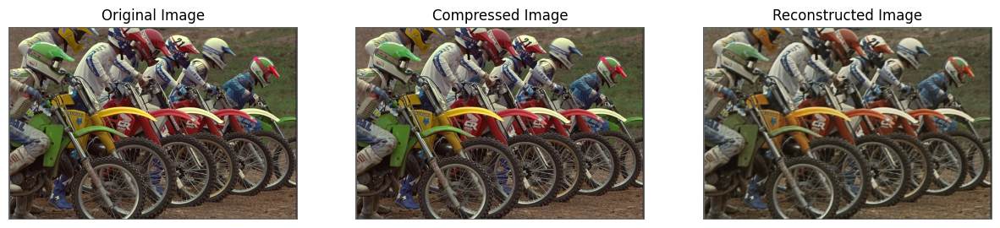

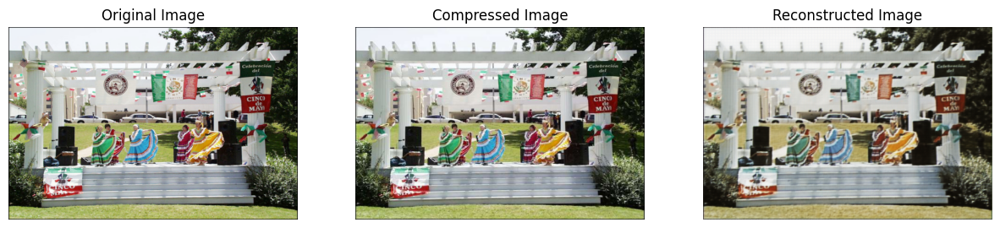

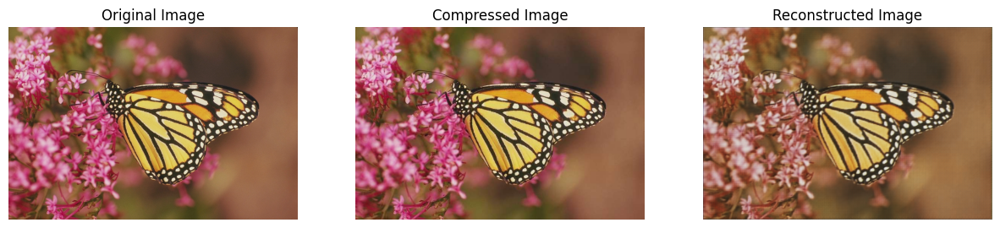

In [19]:
# Visualize the results
visualize_results(model, test_loader, num_images=3)